In [1]:
# Task 1: Exploratory Data Analysis

# 1. Load the Mushroom Dataset:
import pandas as pd
import matplotlib.pyplot as plt
df = pd.read_csv('mushroom.csv')
df

,Unnamed: 0,cap_shape,cap_surface,cap_color,bruises,odor,gill_attachment,gill_spacing,gill_size,gill_color,...,veil_type,veil_color,ring_number,ring_type,spore_print_color,population,habitat,class,stalk_height,cap_diameter
0,1167,sunken,scaly,white,no,anise,descending,distant,broad,pink,...,partial,brown,two,sheathing,chocolate,clustered,waste,poisonous,14.276173,5.054983
1,1037,sunken,fibrous,red,no,anise,notched,crowded,narrow,chocolate,...,universal,brown,two,sheathing,brown,numerous,waste,edible,3.952715,19.068319
2,309,flat,grooves,purple,yes,foul,descending,crowded,broad,purple,...,universal,yellow,two,sheathing,purple,abundant,waste,poisonous,9.054265,7.205884
3,282,bell,scaly,pink,yes,fishy,notched,close,broad,orange,...,partial,yellow,two,cobwebby,green,clustered,grasses,poisonous,5.226499,20.932692
4,820,flat,smooth,yellow,yes,musty,free,crowded,narrow,orange,...,universal,white,none,none,yellow,clustered,urban,poisonous,14.037532,12.545245
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1995,863,sunken,scaly,brown,yes,foul,attached,crowded,narrow,chocolate,...,partial,orange,one,flaring,purple,abundant,leaves,poisonous,5.877891,17.464145
1996,1160,sunken,scaly,purple,yes,musty,attached,distant,narrow,red,...,partial,white,one,zone,yellow,numerous,waste,poisonous,6.500840,13.501957
1997,265,convex,grooves,green,yes,fishy,notched,close,narrow,pink,...,partial,brown,two,evanescent,yellow,abundant,woods,poisonous,13.558064,11.270020
1998,411,bell,smooth,white,no,pungent,free,close,narrow,orange,...,universal,yellow,one,cobwebby,brown,solitary,woods,poisonous,11.092703,8.423199


In [2]:
# 2. Fundamental Data Exploration:

df.describe()

,Unnamed: 0,stalk_height,cap_diameter
count,2000.000000,2000.000000,2000.000000
mean,624.974000,8.449118,12.314345
std,375.091938,3.697217,7.048845
min,0.000000,2.000000,1.000000
25%,290.000000,5.291009,5.723521
50%,607.000000,8.318596,12.124902
75%,957.250000,11.781272,18.698605
max,1279.000000,15.095066,25.000054


In [3]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2000 entries, 0 to 1999
Data columns (total 26 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   Unnamed: 0                2000 non-null   int64  
 1   cap_shape                 2000 non-null   object 
 2   cap_surface               2000 non-null   object 
 3   cap_color                 2000 non-null   object 
 4   bruises                   2000 non-null   object 
 5   odor                      2000 non-null   object 
 6   gill_attachment           2000 non-null   object 
 7   gill_spacing              2000 non-null   object 
 8   gill_size                 2000 non-null   object 
 9   gill_color                2000 non-null   object 
 10  stalk_shape               2000 non-null   object 
 11  stalk_root                2000 non-null   object 
 12  stalk_surface_above_ring  2000 non-null   object 
 13  stalk_surface_below_ring  2000 non-null   object 
 14  stalk_co

In [4]:
df.isnull().sum()

Unnamed: 0                  0
cap_shape                   0
cap_surface                 0
cap_color                   0
bruises                     0
odor                        0
gill_attachment             0
gill_spacing                0
gill_size                   0
gill_color                  0
stalk_shape                 0
stalk_root                  0
stalk_surface_above_ring    0
stalk_surface_below_ring    0
stalk_color_above_ring      0
stalk_color_below_ring      0
veil_type                   0
veil_color                  0
ring_number                 0
ring_type                   0
spore_print_color           0
population                  0
habitat                     0
class                       0
stalk_height                0
cap_diameter                0
dtype: int64

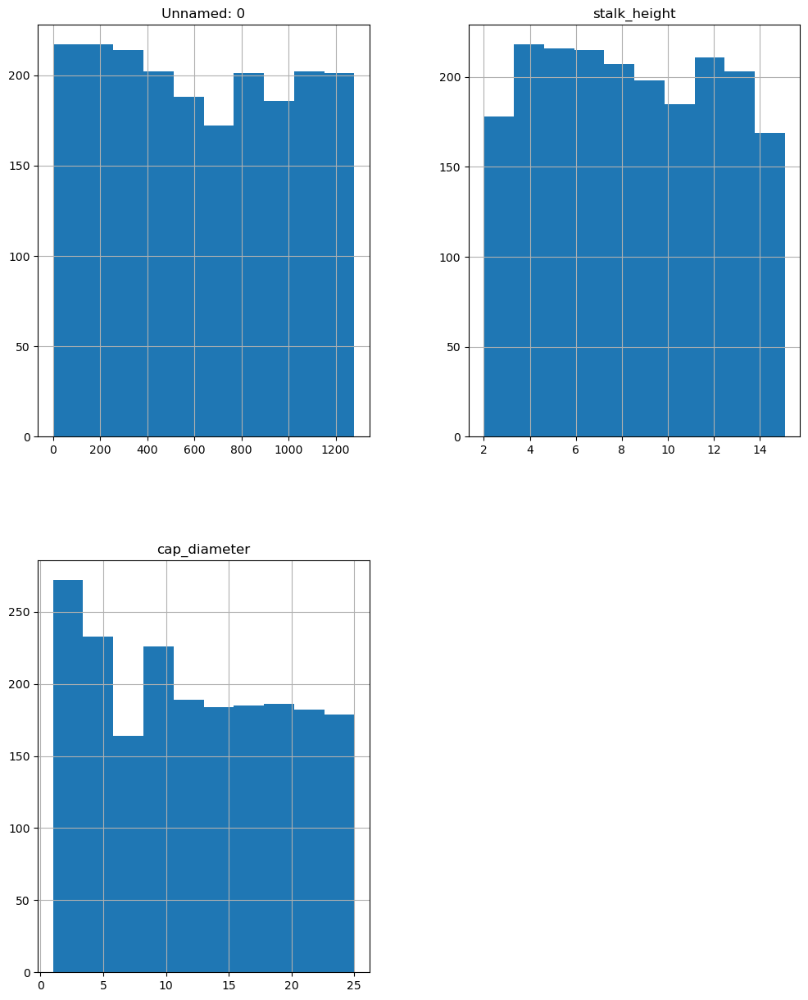

In [5]:
# Histogram graph
df.hist(figsize=(12, 15))
plt.show()

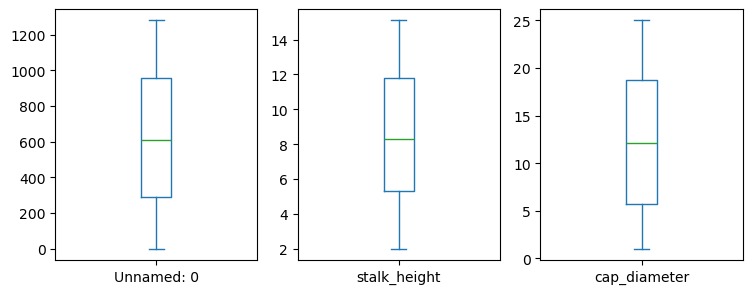

In [6]:
# Box Plot
df.plot(kind='box', subplots=True, layout=(4,4), figsize=(12,15))
plt.show()

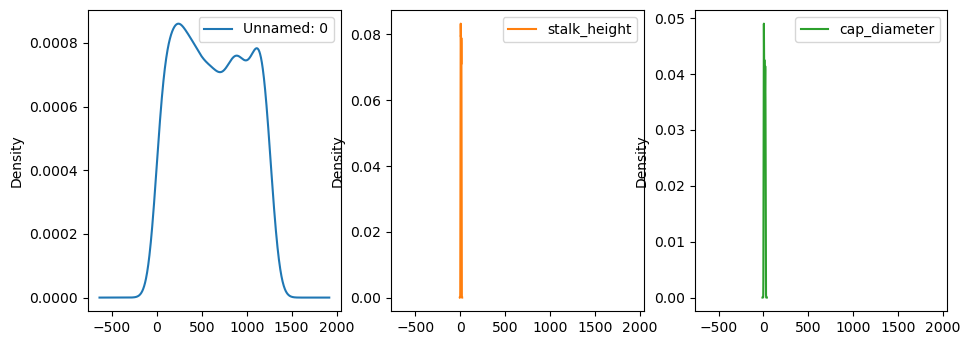

In [7]:
# Density Plot
df.plot(kind='density', subplots=True, layout=(4,4), figsize=(15,18))
plt.show()

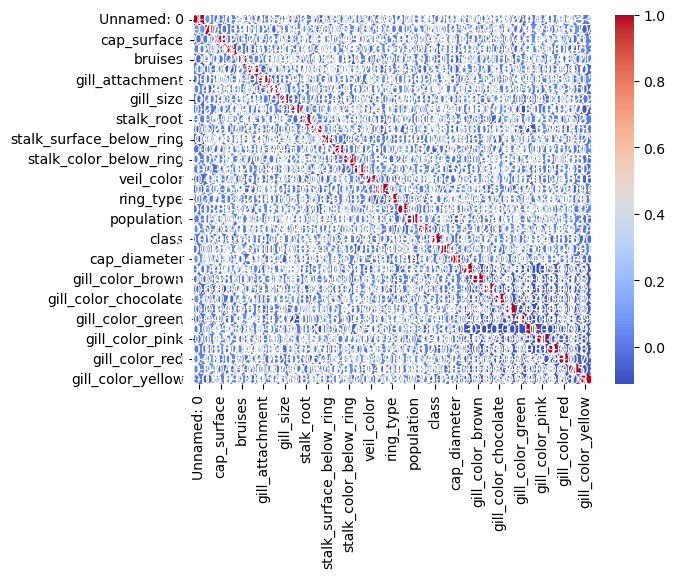

In [8]:
import seaborn as sns

# Converting categorical variables with 10 or fewer unique values into numeric codes
for col in df.select_dtypes(include=['object']):
    if df[col].nunique() <= 10:
        df[col] = pd.Categorical(df[col]).codes

# One-hot encoding remaining categorical variables
df = pd.get_dummies(df, columns=df.select_dtypes(include=['object']).columns)

# Calculating the correlation matrix
corr = df.corr()

# Plotting the correlation heatmap
sns.heatmap(corr, annot=True, cmap='coolwarm')
plt.show()

In [9]:
# Task 2: Data Preprocessing

# 1. Encode Categorical Variables:
from sklearn.preprocessing import LabelEncoder

for column in df.columns:
    if df[column].dtype == object:
        le = LabelEncoder()
        df[column] = le.fit_transform(df[column])

In [10]:
# 2.Split the Dataset:

from sklearn.model_selection import train_test_split

X = df.drop('class', axis=1)  # Assuming 'class' is the target variable
y = df['class']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)
X_train, X_test, y_train, y_test

(      Unnamed: 0  cap_shape  cap_surface  cap_color  bruises  odor  \
 836          898          2            2          0        0     5   
 575           91          0            3          6        0     0   
 557          678          0            1          4        1     3   
 1235          29          0            2          4        1     7   
 1360          14          4            1          5        0     0   
 ...          ...        ...          ...        ...      ...   ...   
 1130         609          4            2          8        0     1   
 1294        1244          1            1          6        1     4   
 860            2          3            3          0        0     4   
 1459        1105          4            1          8        0     1   
 1126         785          3            3          6        1     0   
 
       gill_attachment  gill_spacing  gill_size  stalk_shape  ...  \
 836                 0             0          1            0  ...   
 575    

In [11]:
# Task 3: Data Visualization

#Pair plot
sns.pairplot(df, hue='class')
plt.show()

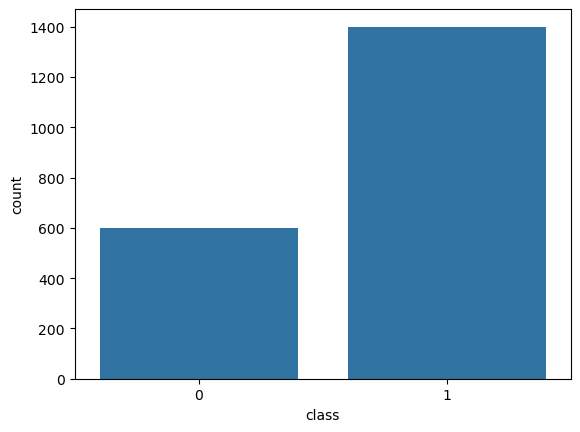

In [12]:
#Count Plot
sns.countplot(x='class', data=df)
plt.show()

In [13]:
# Task 4: SVM Implementation

from sklearn.svm import SVC
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix

# Implementing the SVM classifier (with linear kernel as a start)
svm_classifier = SVC(kernel='linear', random_state=42)

# Training the SVM model
svm_classifier.fit(X_train, y_train)

# Making predictions on the testing data
y_pred = svm_classifier.predict(X_test)

# Evaluating the model
accuracy = accuracy_score(y_test, y_pred)
print(f"Accuracy: {accuracy * 100:.2f}%")

Accuracy: 69.17%


In [14]:
# Detailed classification report
print("Classification Report:\n", classification_report(y_test, y_pred))

Classification Report:
               precision    recall  f1-score   support

           0       0.00      0.00      0.00       185
           1       0.69      1.00      0.82       415

    accuracy                           0.69       600
   macro avg       0.35      0.50      0.41       600
weighted avg       0.48      0.69      0.57       600



C:\Users\Kanta. Sai Dhanush\anaconda3\Latest Anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
C:\Users\Kanta. Sai Dhanush\anaconda3\Latest Anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
C:\Users\Kanta. Sai Dhanush\anaconda3\Latest Anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, mo

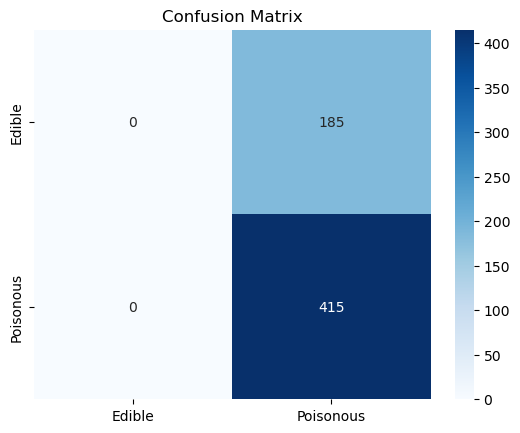

In [15]:
# Confusion matrix
conf_matrix = confusion_matrix(y_test, y_pred)
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues', xticklabels=['Edible', 'Poisonous'], yticklabels=['Edible', 'Poisonous'])
plt.title('Confusion Matrix')
plt.show()

In [16]:
# Task 5: Visualization of SVM Results

# Visualizing a 2D projection of the decision boundary using PCA for dimensionality reduction
from sklearn.decomposition import PCA

# Reducing features to 2D
pca = PCA(n_components=2)
X_train_2d = pca.fit_transform(X_train)
X_test_2d = pca.transform(X_test)

# Re-training SVM with the 2D data
svm_classifier_2d = SVC(kernel='linear', random_state=42)
svm_classifier_2d.fit(X_train_2d, y_train)

SVC(kernel='linear', random_state=42)

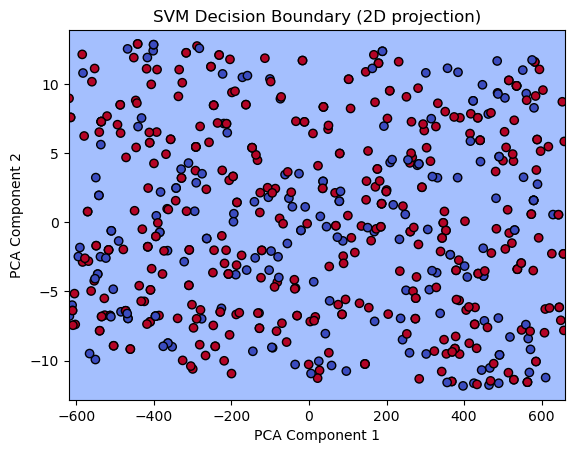

In [17]:
# Plotting decision boundaries

import numpy as np
def plot_decision_boundary(X, y, model):
    h = .02  # step size in the mesh
    x_min, x_max = X[:, 0].min() - 1, X[:, 0].max() + 1
    y_min, y_max = X[:, 1].min() - 1, X[:, 1].max() + 1
    xx, yy = np.meshgrid(np.arange(x_min, x_max, h), np.arange(y_min, y_max, h))
    Z = model.predict(np.c_[xx.ravel(), yy.ravel()])
    Z = Z.reshape(xx.shape)
    plt.contourf(xx, yy, Z, cmap=plt.cm.coolwarm, alpha=0.8)
    plt.scatter(X[:, 0], X[:, 1], c=y, cmap=plt.cm.coolwarm, edgecolors='k')
    plt.xlabel('PCA Component 1')
    plt.ylabel('PCA Component 2')
    plt.title('SVM Decision Boundary (2D projection)')
    plt.show()

plot_decision_boundary(X_test_2d, y_test, svm_classifier_2d)

In [18]:
# Task 6: Parameter Tuning and Optimization

from sklearn.model_selection import GridSearchCV

# Defining a parameter grid for SVM optimization
param_grid = {
    'C': [0.1, 1, 10],
    'kernel': ['linear', 'poly', 'rbf', 'sigmoid'],
    'gamma': ['scale', 'auto']
}

In [ ]:
# Running GridSearch to find the best parameters
grid_search = GridSearchCV(SVC(), param_grid, refit=True, verbose=1, cv=5)
grid_search.fit(X_train, y_train)

# Best parameters found by GridSearch
print("Best Parameters:", grid_search.best_params_)

In [ ]:
# Evaluating the optimized model
y_pred_optimized = grid_search.predict(X_test)
accuracy_optimized = accuracy_score(y_test, y_pred_optimized)
print(f"Optimized Model Accuracy: {accuracy_optimized * 100:.2f}%")

In [ ]:
# Task 7: Comparison and Analysis

# 1. Compare SVM performance with various kernels:
kernels = ['linear', 'poly', 'rbf']
for kernel in kernels:
    svm_classifier = SVC(kernel=kernel, random_state=42)
    svm_classifier.fit(X_train, y_train)
    y_pred_kernel = svm_classifier.predict(X_test)
    accuracy_kernel = accuracy_score(y_test, y_pred_kernel)
    print(f"Accuracy with {kernel} kernel: {accuracy_kernel * 100:.2f}%")\

# 2. Analyze SVM strengths and weaknesses:
##  Strengths: 
### SVM works well for binary classification, is effective in high-dimensional spaces, and is robust to outliers with proper kernel and parameter choices.
##  Weaknesses: 
### SVM can struggle with large datasets, especially with complex kernels, and the choice of kernel is critical for performance.

# 3. Practical implications: 
### In real-world classification tasks, SVM can be useful in situations where high-dimensional data needs to be separated with clear margins. 
### However, for extremely large datasets, other algorithms like Random Forest or Neural Networks might be more efficient.